# Shortwave Radiation & Longwave Radiation

## Import packages

In [1]:
import numpy as np
import xarray as xr
import matplotlib
import matplotlib.pyplot as plt
import netCDF4
import pandas as pd
import seaborn as sns
from scipy import signal
from scipy import stats
from scipy.stats import gaussian_kde
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm

In [4]:
xr.open_dataset('/Volumes/My Passport/processed/model/2017-09-01T000000.nc')

<xarray.Dataset>
Dimensions:    (bnds: 2, level: 85, time: 24)
Coordinates:
  * time       (time) datetime64[ns] 2017-09-01T00:45:00 ... 2017-09-01T23:45...
Dimensions without coordinates: bnds, level
Data variables:
    lat        (time) float64 ...
    lon        (time) float64 ...
    ps         (time) float32 ...
    ta         (time, level) float32 ...
    cl         (time, level) float32 ...
    pfull      (time, level) float32 ...
    clw        (time, level) float32 ...
    cli        (time, level) float32 ...
    zfull      (time, level) float64 ...
    orog       (time) float64 ...
    time_bnds  (time, bnds) datetime64[ns] ...

In [6]:
sim = xr.open_dataset('/Volumes/My Passport/processed/simulate/2017-09-01T000000.nc')

In [11]:
xr.open_dataset('/Volumes/My Passport/ALCF/alcf-tutorial-datasets/ACCESS-AM2/processed/simulate/2017-09-01T000000.nc')

<xarray.Dataset>
Dimensions:          (bnds: 2, column: 10, level: 85, time: 24)
Coordinates:
  * time             (time) float64 2.458e+06 2.458e+06 ... 2.458e+06 2.458e+06
Dimensions without coordinates: bnds, column, level
Data variables:
    lon              (time) float64 ...
    lat              (time) float64 ...
    altitude         (time) float64 ...
    zfull            (time, level) float64 ...
    pfull            (time, level) float64 ...
    backscatter      (time, level, column) float64 ...
    backscatter_mol  (time, level) float64 ...
    time_bnds        (time, bnds) float64 ...

In [14]:
xr.open_dataset('/Volumes/My Passport/ALCF/alcf-tutorial-datasets/ACCESS-AM2/processed/lidar/2017-09-01T000000.nc')

<xarray.Dataset>
Dimensions:          (bnds: 2, column: 10, level: 300, time: 288)
Coordinates:
  * time             (time) float64 2.458e+06 2.458e+06 ... 2.458e+06 2.458e+06
Dimensions without coordinates: bnds, column, level
Data variables:
    lon              (time) float64 ...
    lat              (time) float64 ...
    altitude         (time) float64 ...
    zfull            (level) float64 ...
    backscatter      (time, level, column) float64 ...
    backscatter_mol  (time, level) float64 ...
    time_bnds        (time, bnds) float64 ...
    cloud_mask       (time, level, column) int8 ...
    cbh              (time, column) float64 ...
    lr               (time, column) float64 ...

In [12]:
sim

<xarray.Dataset>
Dimensions:          (bnds: 2, column: 10, level: 85, time: 24)
Coordinates:
  * time             (time) float64 2.458e+06 2.458e+06 ... 2.458e+06 2.458e+06
Dimensions without coordinates: bnds, column, level
Data variables:
    lon              (time) float64 158.4 158.4 158.4 ... 158.4 158.4 158.4
    lat              (time) float64 -54.38 -54.38 -54.38 ... -54.38 -54.38
    altitude         (time) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    zfull            (time, level) float64 20.0 53.33 100.0 ... 7.91e+04 8.5e+04
    pfull            (time, level) float64 1.017e+05 1.013e+05 ... 0.5393 0.1665
    backscatter      (time, level, column) float64 1.831e-07 1.831e-07 ... 0.0
    backscatter_mol  (time, level) float64 1.831e-07 1.827e-07 ... 0.0 0.0
    time_bnds        (time, bnds) float64 2.458e+06 2.458e+06 ... 2.458e+06

In [13]:
xr.open_dataset('/Users/peizhangcheng/Desktop/ALCF/MQI_Ceilometer/Macquarie Island (CL51)/processed_new/lidar/2017-09-01T000000.nc')

<xarray.Dataset>
Dimensions:         (bnds: 2, level: 300, range: 300, time: 288)
Coordinates:
  * time            (time) datetime64[ns] 2017-09-01T00:02:29.999991 ... 2017...
Dimensions without coordinates: bnds, level, range
Data variables:
    time_bnds       (time, bnds) datetime64[ns] ...
    zfull           (level) float64 ...
    backscatter     (time, level) float64 ...
    altitude        (time) float64 ...
    lon             (time) float64 ...
    lat             (time) float64 ...
    backscatter_sd  (time, range) float64 ...
    cloud_mask      (time, level) int8 ...
    cbh             (time) float64 ...
    lr              (time) float64 ...

In [7]:
sim.level

<xarray.DataArray 'level' (level: 85)>
array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
       72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84])
Dimensions without coordinates: level

## Create Pandas Series

In [2]:
Years = [16,17,18]
Months = list(range(1,13))

daily_obs_SW = pd.Series(dtype='float64',name='Obs_SW')
daily_obs_LW = pd.Series(dtype='float64',name='Obs_LW')
pd_data1D_SW = pd.Series(dtype='float64',name='ACCESS_SW')
pd_data1D_LW = pd.Series(dtype='float64',name='ACCESS_LW')
pd_sat_SW = pd.Series(dtype='float64',name='Satellite_SW')
pd_sat_LW = pd.Series(dtype='float64',name='Satellite_LW')

## Loops for reading the data and data cleaning

In [3]:
for Year in Years:
    for Month in Months:
        if (Year == 16) and (Month < 4):
            continue
        elif (Year == 18) and (Month > 3):
            continue
        else:
            filename = '/Users/peizhangcheng/Desktop/Honours/Datasets/b*400_ACCESS_nudged/bx400_SH_met_daily_20' + str(Year) + '-' + str(Month).rjust(2,'0') + '.nc'
            data = xr.open_dataset(filename) 
            # open the model output
            
            filename1 = '/Users/peizhangcheng/Desktop/Honours/Datasets/CERES/CERES_SYN1deg-Day_Terra-Aqua-MODIS_Ed4.1_Subset_20' + str(Year) + '-' + str(Month).rjust(2,'0') + '.nc'
            sat_data = xr.open_dataset(filename1)
            # open the satellite data
            
            fdir = '/Users/peizhangcheng/Desktop/Honours/Project/MQI Radiometers/Radiation_' + str(Year) + str(Month).rjust(2,'0') + '_v4.csv'
            obs = pd.read_csv(fdir) 
            # open the observational data
            
            # data1D = data.interp(lat=-54.6208, lon=158.8556, lat_v=-54.6208, lon_u=158.8556) 
            data1D = data.interp(lat=-54.4996, lon=158.9437, lat_v=-54.4996, lon_u=158.9437)
            # sat_data = sat_data.interp(lat=-54.6208, lon=158.8556) 
            sat_data = sat_data.interp(lat=-54.4996, lon=158.9437) 
            # locate the MI in the model
            
            obs.index = pd.DatetimeIndex(obs['DateTimeUT'])
            obs = obs.dropna()
            daily_obs = obs.resample('D').mean()
            daily_obs.columns = ['Pyranometer_Avg','Pyrgeometer_Avg','CRE','SW_CRE','LW_CRE','SW_clr','LW_clr']
            daily_obs = daily_obs.set_index(pd.to_datetime(daily_obs.index.values) + pd.Timedelta(hours = 12))
            daily_obs['2016-04-04'] = np.nan
            daily_obs['2016-04-09'] = np.nan
            daily_obs['2016-04-10'] = np.nan
            daily_obs['2016-05-02'] = np.nan
            daily_obs['2016-05-03'] = np.nan
            daily_obs['2016-12-15'] = np.nan
            daily_obs['2016-12-16'] = np.nan
            daily_obs['2017-06-09'] = np.nan
            daily_obs['2018-03-06'] = np.nan
            # do some cleaning and calculate the mean
            
            if (Year == 16) and (Month == 4):
                data1D_rsds = data1D.rsds.where((data1D.rsds.time!=data1D.rsds.time[0])&(data1D.rsds.time!=data1D.rsds.time[1])&(data1D.rsds.time!=data1D.rsds.time[2]), drop=True)
                data1D_rlds = data1D.rlds.where((data1D.rlds.time!=data1D.rlds.time[0])&(data1D.rlds.time!=data1D.rlds.time[1])&(data1D.rlds.time!=data1D.rlds.time[2]), drop=True)
                sat_rsds = sat_data.ini_sfc_sw_down_all_daily.where((sat_data.ini_sfc_sw_down_all_daily.time!=sat_data.ini_sfc_sw_down_all_daily.time[0])&(sat_data.ini_sfc_sw_down_all_daily.time!=sat_data.ini_sfc_sw_down_all_daily.time[1])&(sat_data.ini_sfc_sw_down_all_daily.time!=sat_data.ini_sfc_sw_down_all_daily.time[2]), drop=True)
                sat_rlds = sat_data.ini_sfc_lw_down_all_daily.where((sat_data.ini_sfc_lw_down_all_daily.time!=sat_data.ini_sfc_lw_down_all_daily.time[0])&(sat_data.ini_sfc_lw_down_all_daily.time!=sat_data.ini_sfc_lw_down_all_daily.time[1])&(sat_data.ini_sfc_lw_down_all_daily.time!=sat_data.ini_sfc_lw_down_all_daily.time[2]), drop=True)                
                pd_data1D_rsds = pd.Series(data1D_rsds.to_pandas(),name='rsds')
                pd_data1D_rlds = pd.Series(data1D_rlds.to_pandas(),name='rlds')
                pd_sat_rsds = pd.Series(sat_rsds.to_pandas(),name='sat_SW')
                pd_sat_rlds = pd.Series(sat_rlds.to_pandas(),name='sat_LW')
                # make the number of data in obs and model consistent
                
            elif (Year == 18) and (Month == 3):
                pd_data1D_rsds = pd.Series(data1D.rsds.to_pandas(),name='rsds')
                pd_data1D_rsds = pd_data1D_rsds[:6]
                pd_data1D_rlds = pd.Series(data1D.rlds.to_pandas(),name='rlds')
                pd_data1D_rlds = pd_data1D_rlds[:6]
                pd_sat_rsds = pd.Series(sat_data.ini_sfc_sw_down_all_daily.to_pandas(),name='sat_SW')
                pd_sat_rsds = pd_sat_rsds[:6]
                pd_sat_rlds = pd.Series(sat_data.ini_sfc_lw_down_all_daily.to_pandas(),name='sat_LW')
                pd_sat_rlds = pd_sat_rlds[:6]
            else:
                pd_data1D_rsds = pd.Series(data1D.rsds.to_pandas(),name='rsds')
                pd_data1D_rlds = pd.Series(data1D.rlds.to_pandas(),name='rlds')
                pd_sat_rsds = pd.Series(sat_data.ini_sfc_sw_down_all_daily.to_pandas(),name='sat_SW')
                pd_sat_rlds = pd.Series(sat_data.ini_sfc_lw_down_all_daily.to_pandas(),name='sat_LW')
                # convert the model data into pandas Series to plot
                
            daily_obs_SW = pd.concat([daily_obs_SW, daily_obs.Pyranometer_Avg], axis=0)
            daily_obs_LW = pd.concat([daily_obs_LW, daily_obs.Pyrgeometer_Avg], axis=0)
            pd_data1D_SW = pd.concat([pd_data1D_SW, pd_data1D_rsds], axis=0)                   
            pd_data1D_LW = pd.concat([pd_data1D_LW, pd_data1D_rlds], axis=0)
            pd_sat_SW = pd.concat([pd_sat_SW, pd_sat_rsds], axis=0)
            pd_sat_LW = pd.concat([pd_sat_LW, pd_sat_rlds], axis=0)
                # concat the observational data and model output

<ipython-input-3-b9ebada5c200>:31: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  daily_obs['2016-04-04'] = np.nan
<ipython-input-3-b9ebada5c200>:32: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  daily_obs['2016-04-09'] = np.nan
<ipython-input-3-b9ebada5c200>:33: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  daily_obs['2016-04-10'] = np.nan
<ipython-input-3-b9ebada5c200>:34: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[s

## Plots against timeseries

In [4]:
daily_obs_SW = daily_obs_SW[3:]
daily_obs_LW = daily_obs_LW[3:]
pd_data1D_SW = pd_data1D_SW[1:]
pd_data1D_LW = pd_data1D_LW[1:]
pd_sat_SW = pd_sat_SW[1:]
pd_sat_LW = pd_sat_LW[1:]

In [5]:
daily_obs_SW

2016-04-05 12:00:00     30.898366
2016-04-06 12:00:00     71.132403
2016-04-07 12:00:00     75.640487
2016-04-08 12:00:00     52.997187
2016-04-09 12:00:00           NaN
                          ...    
2018-03-02 12:00:00    156.498101
2018-03-03 12:00:00     91.369661
2018-03-04 12:00:00     65.504197
2018-03-05 12:00:00    150.052708
2018-03-06 12:00:00           NaN
Length: 701, dtype: float64

In [6]:
daily_obs_LW

2016-04-05 12:00:00    339.723840
2016-04-06 12:00:00    310.451084
2016-04-07 12:00:00    308.554003
2016-04-08 12:00:00    303.397496
2016-04-09 12:00:00           NaN
                          ...    
2018-03-02 12:00:00    340.401458
2018-03-03 12:00:00    351.665427
2018-03-04 12:00:00    311.983252
2018-03-05 12:00:00    303.434224
2018-03-06 12:00:00           NaN
Length: 701, dtype: float64

In [7]:
from pylab import xticks,yticks,np

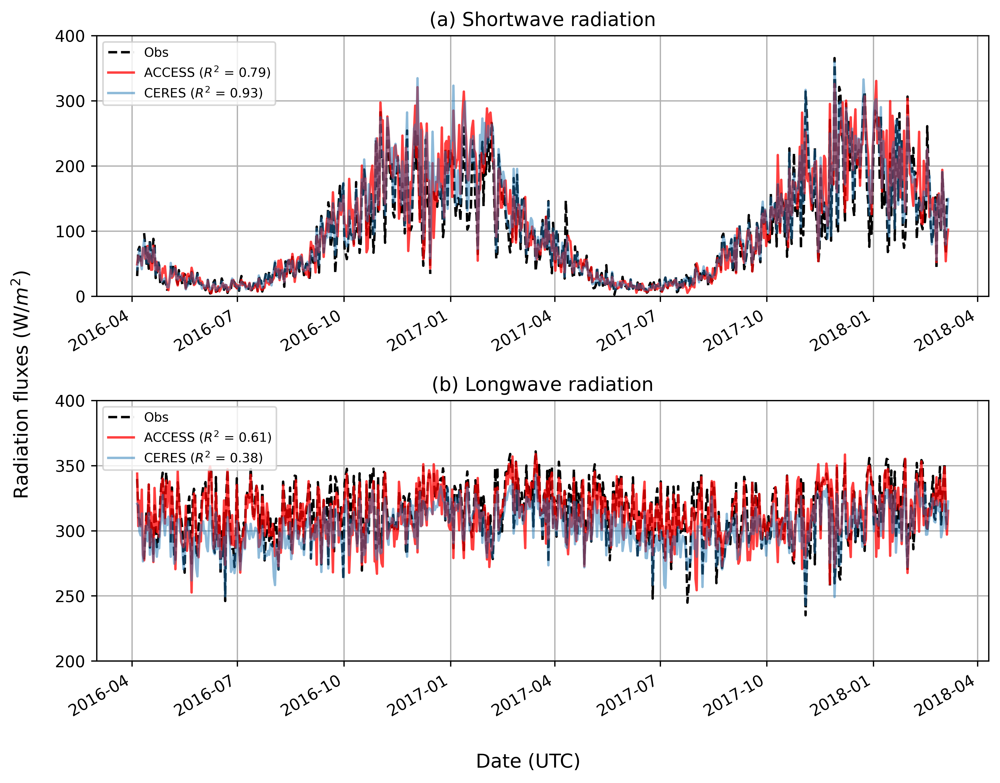

In [17]:
fig = plt.figure(figsize=(10,8),dpi=600)
plt.subplots_adjust(hspace=0.4)
fig.text(0.5, 0.09, 'Date (UTC)', ha='center', va='center',fontsize=12)
fig.text(0.06, 0.5, 'Radiation fluxes (W/$m^{2}$)', ha='center', va='center', rotation='vertical',fontsize=12)

ax1 = plt.subplot(211,)
daily_obs_SW.plot(label='Obs',color='black',linestyle='--');
pd_data1D_SW.plot(label='ACCESS ($R^{2}$ = 0.79)',color='red',alpha=0.75);
pd_sat_SW.plot(label='CERES ($R^{2}$ = 0.93)',alpha=0.5);
plt.legend(fontsize=8);
plt.grid();
plt.ylim(0,400)
yticks(np.linspace(0,400,5,endpoint=True))
plt.title('(a) Shortwave radiation')

ax2 = plt.subplot(212,)
daily_obs_LW.plot(label='Obs',color='black',linestyle='--');
pd_data1D_LW.plot(label='ACCESS ($R^{2}$ = 0.61)',color='red',alpha=0.75);
pd_sat_LW.plot(label='CERES ($R^{2}$ = 0.38)',alpha=0.5);
plt.legend(fontsize=8,loc = 'upper left');
plt.grid();
plt.ylim(200,400)
yticks(np.linspace(200,400,5,endpoint=True))
plt.title('(b) Longwave radiation')

#plt.savefig('/Users/peizhangcheng/Desktop/SW&LW_radiation_timeseries.jpg')

In [9]:
stats.ttest_ind(daily_obs_SW.dropna(),pd_data1D_SW.dropna())

Ttest_indResult(statistic=-2.1246004732069754, pvalue=0.03379577519226827)

In [10]:
stats.ttest_ind(daily_obs_SW.dropna(),pd_sat_SW.dropna())

Ttest_indResult(statistic=-1.844860720914589, pvalue=0.06527012178771316)

In [11]:
stats.ttest_ind(daily_obs_LW.dropna(),pd_data1D_LW.dropna())

Ttest_indResult(statistic=1.9542508345090321, pvalue=0.050871544482159026)

In [12]:
stats.ttest_ind(daily_obs_LW.dropna(),pd_sat_LW.dropna())

Ttest_indResult(statistic=11.61743927689594, pvalue=7.61338186265921e-30)

In [13]:
len(daily_obs_SW.dropna())

693

In [14]:
len(daily_obs_LW.dropna())

693

## Correlations

In [15]:
pd_data1D_SW = pd.Series(pd_data1D_SW, name='ACCESS SW')
daily_obs_SW = pd.Series(daily_obs_SW, name='Obs SW')
pd_sat_SW = pd.Series(pd_sat_SW, name='CERES SW')
pd_SW = pd.concat([pd_data1D_SW,daily_obs_SW,pd_sat_SW],axis=1)
pd_SW.corr()

,ACCESS SW,Obs SW,CERES SW
ACCESS SW,1.000000,0.915566,0.943425
Obs SW,0.915566,1.000000,0.975858
CERES SW,0.943425,0.975858,1.000000


In [21]:
pd_data1D_LW = pd.Series(pd_data1D_LW, name='ACCESS LW')
daily_obs_LW = pd.Series(daily_obs_LW, name='Obs LW')
pd_sat_LW = pd.Series(pd_sat_LW, name='CERES LW')
pd_LW = pd.concat([pd_data1D_LW,daily_obs_LW,pd_sat_LW],axis=1)
pd_LW.corr()

,ACCESS LW,Obs LW,CERES LW
ACCESS LW,1.000000,0.778537,0.684741
Obs LW,0.778537,1.000000,0.831992
CERES LW,0.684741,0.831992,1.000000


In [17]:
pd_SW = pd_SW.dropna()
pd_LW = pd_LW.dropna()

In [18]:
pd_SW

,ACCESS SW,Obs SW,CERES SW
2016-04-05 12:00:00,48.827817,30.898366,41.039569
2016-04-06 12:00:00,61.889606,71.132403,60.295968
2016-04-07 12:00:00,57.812981,75.640487,72.185493
2016-04-08 12:00:00,56.128416,52.997187,53.259958
2016-04-11 12:00:00,73.130889,96.729784,86.417914
...,...,...,...
2018-03-01 12:00:00,193.904283,190.088526,190.656126
2018-03-02 12:00:00,153.258633,156.498101,158.179891
2018-03-03 12:00:00,112.070734,91.369661,98.770342
2018-03-04 12:00:00,53.586255,65.504197,79.240969


In [19]:
from sklearn.metrics import r2_score

In [20]:
r2_score(pd_SW['Obs SW'],pd_SW['ACCESS SW'])

0.7913101246720339

In [21]:
r2_score(pd_SW['Obs SW'],pd_SW['CERES SW'])

0.9331907951493036

In [22]:
r2_score(pd_LW['Obs LW'],pd_LW['ACCESS LW'])

0.6052388987083257

In [23]:
r2_score(pd_LW['Obs LW'],pd_LW['CERES LW'])

0.37906167684223135

In [24]:
daily_obs_SW = pd_SW['Obs SW']
daily_obs_LW = pd_LW['Obs LW']
pd_data1D_SW = pd_SW['ACCESS SW']
pd_data1D_LW = pd_LW['ACCESS LW']
pd_sat_SW = pd_SW['CERES SW']
pd_sat_LW = pd_LW['CERES LW']

In [25]:
SW_matrix = pd_SW.corr()
LW_matrix = pd_LW.corr()

<AxesSubplot:>

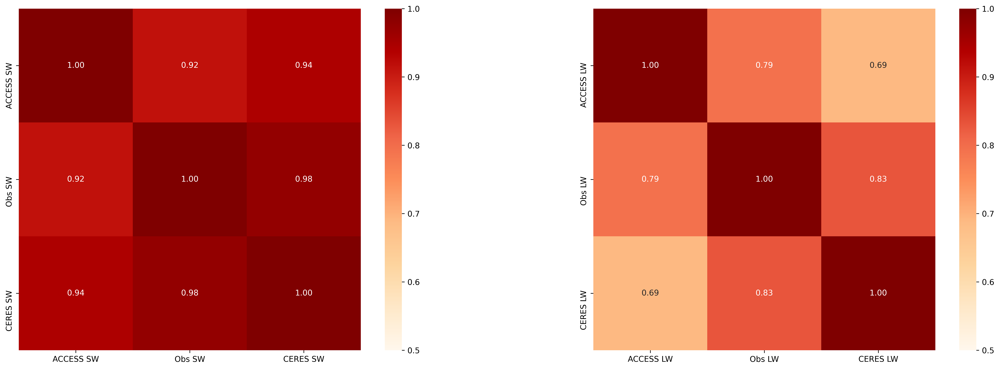

In [26]:
cmap = sns.diverging_palette(250, 15, s=75, l=40, n=5, center='light',as_cmap=True)
cmap1 = sns.cubehelix_palette(start = 1.5, rot = 3, gamma=0.8, as_cmap = True)
plt.figure(figsize=(24,8),dpi=600)

ax1 = plt.subplot(121,)
sns.heatmap(SW_matrix, vmin=0.5, vmax=1.0, annot=True, fmt='.2f', square=True, cmap='OrRd')

ax2 = plt.subplot(122,)
sns.heatmap(LW_matrix, vmin=0.5, vmax=1.0, annot=True, fmt='.2f', square=True, cmap='OrRd')

# plt.savefig('/Users/peizhangcheng/Desktop/SW&LW_radiation_correlations.jpg')

## Distributions

In [27]:
from matplotlib.pyplot import MultipleLocator

Text(0.5, 0, 'Longwave Radiation (W/$m^{2}$)')

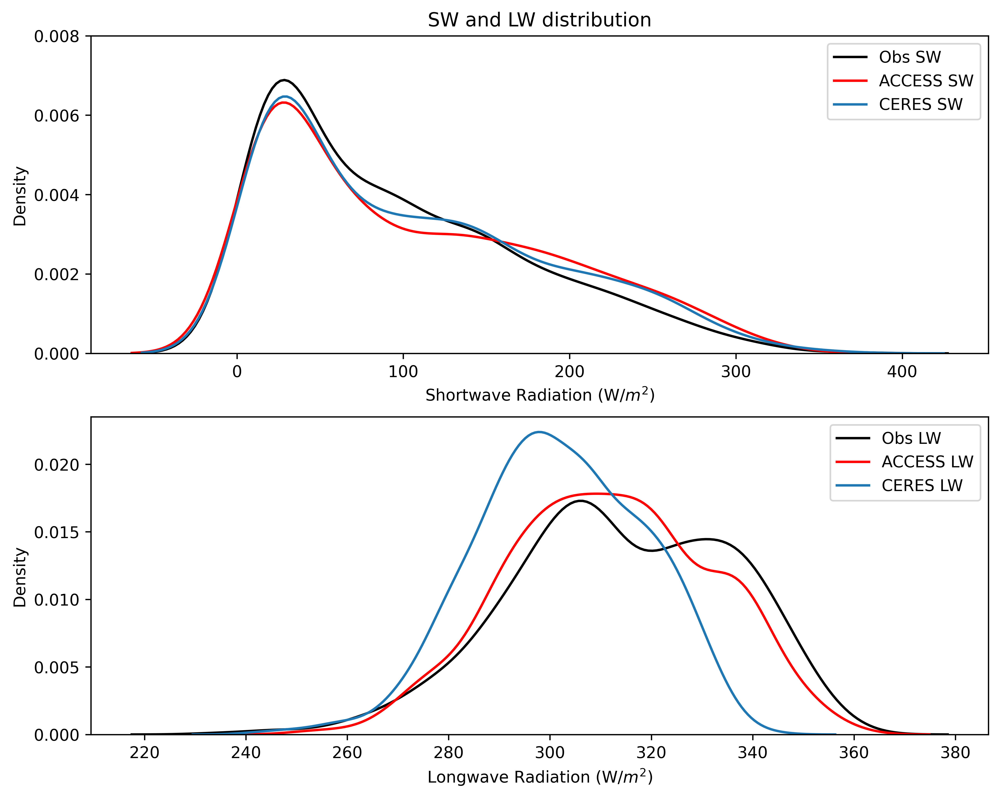

In [26]:
fig = plt.figure(figsize=(10,8),dpi=600)

ax1 = plt.subplot(211,)
sns.kdeplot(x=daily_obs_SW, label='Obs SW',color='black')
sns.kdeplot(x=pd_data1D_SW, label='ACCESS SW',color='red')
sns.kdeplot(x=pd_sat_SW, label='CERES SW')
plt.legend()
plt.ylim(0,0.008)
plt.xlabel('Shortwave Radiation (W/$m^{2}$)')
y_major_locator = MultipleLocator(0.002)
ax1.yaxis.set_major_locator(y_major_locator)
plt.title('SW and LW distribution')

ax2 = plt.subplot(212,)
sns.kdeplot(x=daily_obs_LW, label='Obs LW',color='black')
sns.kdeplot(x=pd_data1D_LW, label='ACCESS LW',color='red')
sns.kdeplot(x=pd_sat_LW, label='CERES LW')
plt.legend()
plt.xlabel('Longwave Radiation (W/$m^{2}$)')

# plt.savefig('/Users/peizhangcheng/Desktop/SW&LW_radiation_distribution.jpg')

## Scatters

In [27]:
#pd_data1D_SW = pd_data1D_SW.where(daily_obs_SW.isna()==False)
#daily_obs_SW = daily_obs_SW.where(daily_obs_SW.isna()==False)
#pd_sat_SW = pd_sat_SW.where(daily_obs_SW.isna()==False)
#pd_data1D_LW = pd_data1D_LW.where(daily_obs_SW.isna()==False)
#daily_obs_LW = daily_obs_LW.where(daily_obs_SW.isna()==False)
#pd_sat_LW = pd_sat_LW.where(daily_obs_SW.isna()==False)

#np_data1D_SW = pd_data1D_SW.values
#np_obs_SW = daily_obs_SW
#np_sat_SW = pd_sat_SW.values
#np_data1D_LW = pd_data1D_LW.values
#np_obs_LW = daily_obs_LW
#np_sat_LW = pd_sat_LW.values

#np_data1D_SW = np_data1D_SW[~pd.isna(np_data1D_SW)]
#np_obs_SW = np_obs_SW[~pd.isna(np_obs_SW)]
#np_sat_SW = np_sat_SW[~pd.isna(np_sat_SW)]
#np_data1D_LW = np_data1D_LW[~pd.isna(np_data1D_LW)]
#np_obs_LW = np_obs_LW[~pd.isna(np_obs_LW)]
#np_sat_LW = np_sat_LW[~pd.isna(np_sat_LW)]

<ipython-input-28-217b972b1327>:13: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  plt.hist2d(x1, y1, bins=40, norm=LogNorm(), cmap='viridis_r', vmin=1, vmax=100)
<ipython-input-28-217b972b1327>:30: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  plt.hist2d(x2, y2, bins=25, norm=LogNorm(), cmap='viridis_r', vmin=1, vmax=100)


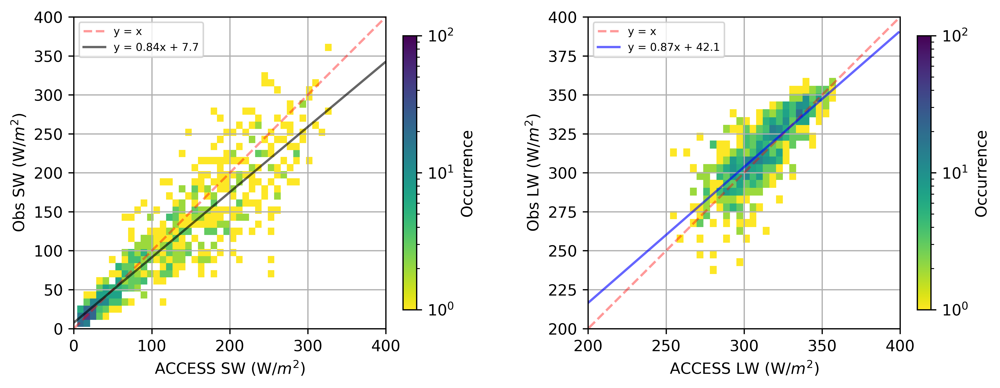

In [28]:
fig = plt.figure(figsize=(10,8), dpi=600)
plt.subplots_adjust(wspace=0.5)

ax1 = plt.subplot(121,)

x1 = pd_data1D_SW
y1 = daily_obs_SW
x = np.arange(400)

plt.gca().set_aspect('equal', adjustable='box')
plt.xlabel('ACCESS SW (W/$m^{2}$)')
plt.ylabel('Obs SW (W/$m^{2}$)')
plt.hist2d(x1, y1, bins=40, norm=LogNorm(), cmap='viridis_r', vmin=1, vmax=100)
plt.xlim(0,400)
plt.ylim(0,400)
plt.plot(x,x,"--",color='r',alpha=0.4,label='y = x')
plt.plot(x,0.8374*x + 7.676,"-",color='black',alpha=0.6,label='y = 0.84x + 7.7')
plt.legend(fontsize=7)
plt.grid()
plt.colorbar(label='Occurrence', fraction=0.04)

ax2 = plt.subplot(122,)

x2 = pd_data1D_LW
y2 = daily_obs_LW

plt.gca().set_aspect('equal', adjustable='box')
plt.xlabel('ACCESS LW (W/$m^{2}$)')
plt.ylabel('Obs LW (W/$m^{2}$)')
plt.hist2d(x2, y2, bins=25, norm=LogNorm(), cmap='viridis_r', vmin=1, vmax=100)
plt.xlim(200,400)
plt.ylim(200,400)
plt.plot(x,x,"--",color='r',alpha=0.4,label='y = x')
plt.plot(x,0.8721*x + 42.11,"-",color='blue',alpha=0.6,label='y = 0.87x + 42.1')
plt.legend(fontsize=7)
plt.grid()
plt.colorbar(label='Occurrence', fraction=0.04)

# plt.savefig('/Users/peizhangcheng/Desktop/SW&LW_radiation_scatter_obs.jpg')

In [29]:
z1 = np.polyfit(x1, y1, 1)
p1 = np.poly1d(z1) 
print(p1)

z2 = np.polyfit(x2, y2, 1)
p2 = np.poly1d(z2) 
print(p2)

 
0.8374 x + 7.676
 
0.8721 x + 42.11


<ipython-input-30-ceadac754197>:14: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  plt.hist2d(x1, y1, bins=40, norm=LogNorm(), cmap='viridis_r', vmin=1, vmax=100)
<ipython-input-30-ceadac754197>:31: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  plt.hist2d(x2, y2, bins=25, norm=LogNorm(), cmap='viridis_r', vmin=1, vmax=100)


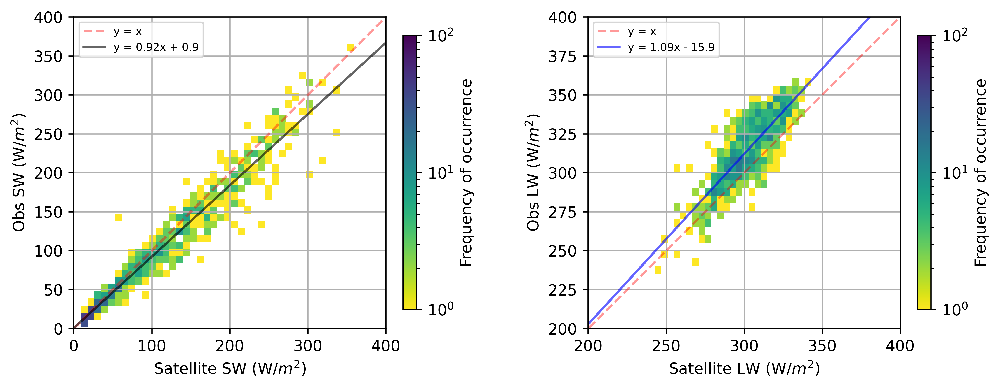

In [30]:
fig = plt.figure(figsize=(10,8), dpi=600)
plt.subplots_adjust(wspace=0.5)

ax1 = plt.subplot(121,)

x1 = pd_sat_SW
y1 = daily_obs_SW

plt.xlim(0,400)
plt.ylim(0,400)
plt.gca().set_aspect('equal', adjustable='box')
plt.xlabel('Satellite SW (W/$m^{2}$)')
plt.ylabel('Obs SW (W/$m^{2}$)')
plt.hist2d(x1, y1, bins=40, norm=LogNorm(), cmap='viridis_r', vmin=1, vmax=100)
plt.xlim(0,400)
plt.ylim(0,400)
plt.plot(x,x,"--",color='r',alpha=0.4,label='y = x')
plt.plot(x,0.915*x + 0.8667,"-",color='black',alpha=0.6,label='y = 0.92x + 0.9')
plt.legend(fontsize=7)
plt.grid()
plt.colorbar(label='Frequency of occurrence', fraction=0.04)

ax2 = plt.subplot(122,)

x2 = pd_sat_LW
y2 = daily_obs_LW

plt.gca().set_aspect('equal', adjustable='box')
plt.xlabel('Satellite LW (W/$m^{2}$)')
plt.ylabel('Obs LW (W/$m^{2}$)')
plt.hist2d(x2, y2, bins=25, norm=LogNorm(), cmap='viridis_r', vmin=1, vmax=100)
plt.xlim(200,400)
plt.ylim(200,400)
plt.plot(x,x,"--",color='r',alpha=0.4,label='y = x')
plt.plot(x,1.093*x - 15.88,"-",color='blue',alpha=0.6,label='y = 1.09x - 15.9')
plt.legend(fontsize=7)
plt.grid()
plt.colorbar(label='Frequency of occurrence', fraction=0.04)

In [28]:
print(np.mean(daily_obs_SW),np.mean(pd_data1D_SW),np.mean(pd_sat_SW))

95.9100604753845 105.36423926276736 103.87203588785704


In [29]:
print(np.std(daily_obs_SW),np.std(pd_data1D_SW),np.std(pd_sat_SW))

76.29567231023539 83.41561871777635 81.36976665981264


In [30]:
print(np.mean(daily_obs_LW),np.mean(pd_data1D_LW),np.mean(pd_sat_LW))

313.99043555528954 311.74113122975234 301.91073828395423


In [31]:
print(np.std(daily_obs_LW),np.std(pd_data1D_LW),np.std(pd_sat_LW))

21.759551892085373 19.794749013764022 16.569261720680018


In [33]:
np.std(pd_data1D_SW - daily_obs_SW)

33.547107889206835

In [34]:
np.std(pd_data1D_LW - daily_obs_LW)

13.48522768328277

In [52]:
np.std(pd_sat_SW - daily_obs_SW)

18.04176563993006

In [53]:
np.std(pd_sat_LW - daily_obs_LW)

12.168878764904525

## Histograms

Text(0, 0.5, 'Density')

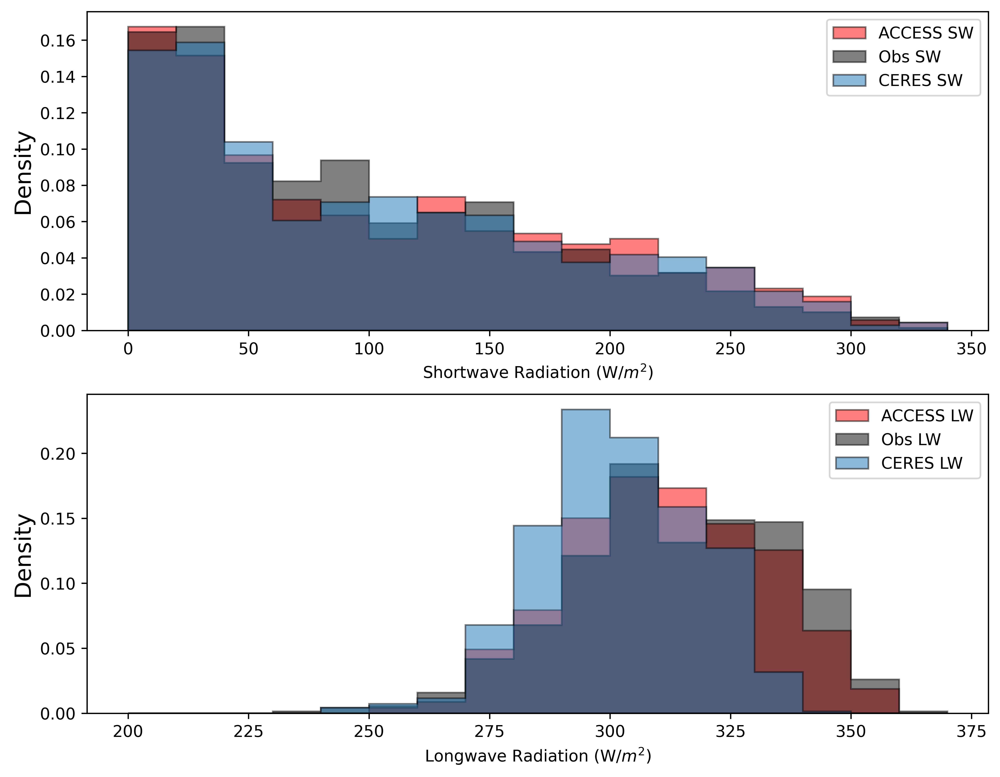

In [35]:
fig = plt.figure(figsize=(10,8),dpi=600)

ax1 = plt.subplot(211,)
weights1 = np.ones_like(pd_data1D_SW) / len(pd_data1D_SW)
weights2 = np.ones_like(daily_obs_SW) / len(daily_obs_SW)
weights3 = np.ones_like(pd_sat_SW) / len(pd_sat_SW)

plt.hist(pd_data1D_SW, weights=weights1, bins=np.arange(0,350,20), histtype="stepfilled", alpha=0.5, edgecolor='black', label='ACCESS SW',color='red')
plt.hist(daily_obs_SW, weights=weights2, bins=np.arange(0,350,20), histtype="stepfilled", alpha=0.5, edgecolor='black', label='Obs SW',color='black')
plt.hist(pd_sat_SW, weights=weights3, bins=np.arange(0,350,20), histtype="stepfilled", alpha=0.5, edgecolor='black', label='CERES SW')
plt.legend()
plt.xlabel('Shortwave Radiation (W/$m^{2}$)')
ax1.set_ylabel("Density", fontsize=14)

ax2 = plt.subplot(212,)
weights4 = np.ones_like(pd_data1D_LW) / len(pd_data1D_LW)
weights5 = np.ones_like(daily_obs_LW) / len(daily_obs_LW)
weights6 = np.ones_like(pd_sat_LW) / len(pd_sat_LW)

plt.hist(pd_data1D_LW, weights=weights4, bins=np.arange(200,375,10), histtype="stepfilled", alpha=0.5, edgecolor='black', label='ACCESS LW',color='red')
plt.hist(daily_obs_LW, weights=weights5, bins=np.arange(200,375,10), histtype="stepfilled", alpha=0.5, edgecolor='black', label='Obs LW',color='black')
plt.hist(pd_sat_LW, weights=weights6, bins=np.arange(200,375,10), histtype="stepfilled", alpha=0.5, edgecolor='black', label='CERES LW')
plt.legend()
plt.xlabel('Longwave Radiation (W/$m^{2}$)')
ax2.set_ylabel("Density", fontsize=14)

# Remove seasonal effect

### Add seasons into pandas dataframe

In [35]:
season = pd.Series(name='Season',dtype='string')
pd_data1D_SW = pd.Series(pd_data1D_SW,name="ACCESS SW")
pd_data1D_LW = pd.Series(pd_data1D_LW,name="ACCESS LW")
pd_sat_SW = pd.Series(pd_sat_SW,name="CERES SW")
pd_sat_LW = pd.Series(pd_sat_LW,name="CERES LW")
daily_obs_SW_season = pd.concat([daily_obs_SW,season],axis=1)
pd_data1D_SW_season = pd.concat([pd_data1D_SW,season],axis=1)
pd_sat_SW_season = pd.concat([pd_sat_SW,season],axis=1)
daily_obs_LW_season = pd.concat([daily_obs_LW,season],axis=1)
pd_data1D_LW_season = pd.concat([pd_data1D_LW,season],axis=1)
pd_sat_LW_season = pd.concat([pd_sat_LW,season],axis=1)

### Identify seasons

In [36]:
for row in daily_obs_SW_season.index:
    if (str(row)[5:7] == str(12).rjust(2,'0')) or (str(row)[5:7] == str(1).rjust(2,'0')) or (str(row)[5:7] == str(2).rjust(2,'0')):
        daily_obs_SW_season['Season'][row] = 'DJF'
    elif (str(row)[5:7] == str(3).rjust(2,'0')) or (str(row)[5:7] == str(4).rjust(2,'0')) or (str(row)[5:7] == str(5).rjust(2,'0')):
        daily_obs_SW_season['Season'][row] = 'MAM'
    elif (str(row)[5:7] == str(6).rjust(2,'0')) or (str(row)[5:7] == str(7).rjust(2,'0')) or (str(row)[5:7] == str(8).rjust(2,'0')):
        daily_obs_SW_season['Season'][row] = 'JJA'
    else:
        daily_obs_SW_season['Season'][row] = 'SON'
        
for row in pd_data1D_SW_season.index:
    if (str(row)[5:7] == str(12).rjust(2,'0')) or (str(row)[5:7] == str(1).rjust(2,'0')) or (str(row)[5:7] == str(2).rjust(2,'0')):
        pd_data1D_SW_season['Season'][row] = 'DJF'
    elif (str(row)[5:7] == str(3).rjust(2,'0')) or (str(row)[5:7] == str(4).rjust(2,'0')) or (str(row)[5:7] == str(5).rjust(2,'0')):
        pd_data1D_SW_season['Season'][row] = 'MAM'
    elif (str(row)[5:7] == str(6).rjust(2,'0')) or (str(row)[5:7] == str(7).rjust(2,'0')) or (str(row)[5:7] == str(8).rjust(2,'0')):
        pd_data1D_SW_season['Season'][row] = 'JJA'
    else:
        pd_data1D_SW_season['Season'][row] = 'SON'

for row in pd_sat_SW_season.index:
    if (str(row)[5:7] == str(12).rjust(2,'0')) or (str(row)[5:7] == str(1).rjust(2,'0')) or (str(row)[5:7] == str(2).rjust(2,'0')):
        pd_sat_SW_season['Season'][row] = 'DJF'
    elif (str(row)[5:7] == str(3).rjust(2,'0')) or (str(row)[5:7] == str(4).rjust(2,'0')) or (str(row)[5:7] == str(5).rjust(2,'0')):
        pd_sat_SW_season['Season'][row] = 'MAM'
    elif (str(row)[5:7] == str(6).rjust(2,'0')) or (str(row)[5:7] == str(7).rjust(2,'0')) or (str(row)[5:7] == str(8).rjust(2,'0')):
        pd_sat_SW_season['Season'][row] = 'JJA'
    else:
        pd_sat_SW_season['Season'][row] = 'SON'
        
for row in daily_obs_LW_season.index:
    if (str(row)[5:7] == str(12).rjust(2,'0')) or (str(row)[5:7] == str(1).rjust(2,'0')) or (str(row)[5:7] == str(2).rjust(2,'0')):
        daily_obs_LW_season['Season'][row] = 'DJF'
    elif (str(row)[5:7] == str(3).rjust(2,'0')) or (str(row)[5:7] == str(4).rjust(2,'0')) or (str(row)[5:7] == str(5).rjust(2,'0')):
        daily_obs_LW_season['Season'][row] = 'MAM'
    elif (str(row)[5:7] == str(6).rjust(2,'0')) or (str(row)[5:7] == str(7).rjust(2,'0')) or (str(row)[5:7] == str(8).rjust(2,'0')):
        daily_obs_LW_season['Season'][row] = 'JJA'
    else:
        daily_obs_LW_season['Season'][row] = 'SON'
        
for row in pd_data1D_LW_season.index:
    if (str(row)[5:7] == str(12).rjust(2,'0')) or (str(row)[5:7] == str(1).rjust(2,'0')) or (str(row)[5:7] == str(2).rjust(2,'0')):
        pd_data1D_LW_season['Season'][row] = 'DJF'
    elif (str(row)[5:7] == str(3).rjust(2,'0')) or (str(row)[5:7] == str(4).rjust(2,'0')) or (str(row)[5:7] == str(5).rjust(2,'0')):
        pd_data1D_LW_season['Season'][row] = 'MAM'
    elif (str(row)[5:7] == str(6).rjust(2,'0')) or (str(row)[5:7] == str(7).rjust(2,'0')) or (str(row)[5:7] == str(8).rjust(2,'0')):
        pd_data1D_LW_season['Season'][row] = 'JJA'
    else:
        pd_data1D_LW_season['Season'][row] = 'SON'

for row in pd_sat_LW_season.index:
    if (str(row)[5:7] == str(12).rjust(2,'0')) or (str(row)[5:7] == str(1).rjust(2,'0')) or (str(row)[5:7] == str(2).rjust(2,'0')):
        pd_sat_LW_season['Season'][row] = 'DJF'
    elif (str(row)[5:7] == str(3).rjust(2,'0')) or (str(row)[5:7] == str(4).rjust(2,'0')) or (str(row)[5:7] == str(5).rjust(2,'0')):
        pd_sat_LW_season['Season'][row] = 'MAM'
    elif (str(row)[5:7] == str(6).rjust(2,'0')) or (str(row)[5:7] == str(7).rjust(2,'0')) or (str(row)[5:7] == str(8).rjust(2,'0')):
        pd_sat_LW_season['Season'][row] = 'JJA'
    else:
        pd_sat_LW_season['Season'][row] = 'SON'

In [37]:
product = pd.Series(name='Product',dtype='string')

In [38]:
daily_obs_SW_season_product = pd.concat([daily_obs_SW_season, product],axis=1)
daily_obs_LW_season_product = pd.concat([daily_obs_LW_season, product],axis=1)
pd_data1D_SW_season_product = pd.concat([pd_data1D_SW_season, product],axis=1)
pd_data1D_LW_season_product = pd.concat([pd_data1D_LW_season, product],axis=1)
pd_sat_SW_season_product = pd.concat([pd_sat_SW_season, product],axis=1)
pd_sat_LW_season_product = pd.concat([pd_sat_LW_season, product],axis=1)

In [39]:
for row in daily_obs_SW_season_product.index:
    daily_obs_SW_season_product['Product'][row] = 'Obs'
    
for row in daily_obs_LW_season_product.index:
    daily_obs_LW_season_product['Product'][row] = 'Obs'

for row in pd_data1D_SW_season_product.index:
    pd_data1D_SW_season_product['Product'][row] = 'ACCESS'

for row in pd_data1D_LW_season_product.index:
    pd_data1D_LW_season_product['Product'][row] = 'ACCESS'

for row in pd_sat_SW_season_product.index:
    pd_sat_SW_season_product['Product'][row] = 'CERES'
    
for row in pd_sat_LW_season_product.index:
    pd_sat_LW_season_product['Product'][row] = 'CERES'

In [40]:
daily_obs_SW_season_product = daily_obs_SW_season_product.rename(columns={'Obs SW':'SW'})
pd_data1D_SW_season_product = pd_data1D_SW_season_product.rename(columns={'ACCESS SW':'SW'})
pd_sat_SW_season_product = pd_sat_SW_season_product.rename(columns={'CERES SW':'SW'})

In [41]:
daily_obs_LW_season_product = daily_obs_LW_season_product.rename(columns={'Obs LW':'LW'})
pd_data1D_LW_season_product = pd_data1D_LW_season_product.rename(columns={'ACCESS LW':'LW'})
pd_sat_LW_season_product = pd_sat_LW_season_product.rename(columns={'CERES LW':'LW'})

In [42]:
violin_SW = pd.concat([daily_obs_SW_season_product,pd_data1D_SW_season_product,pd_sat_SW_season_product], axis=0)

In [43]:
violin_LW = pd.concat([daily_obs_LW_season_product,pd_data1D_LW_season_product,pd_sat_LW_season_product], axis=0)

(200.0, 400.0)

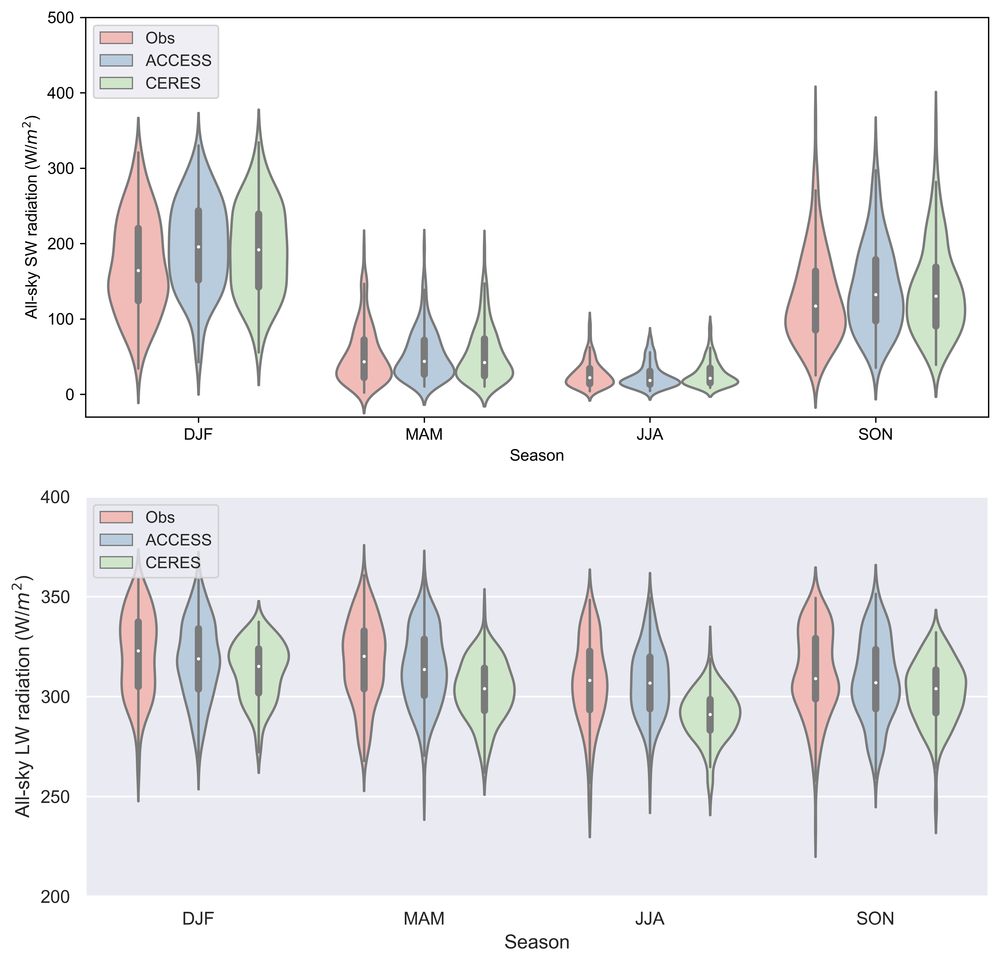

In [44]:
fig = plt.figure(figsize=(10,10), dpi=600)
plt.subplots_adjust(wspace=0.85)

ax1 = plt.subplot(211,)
sns.set(style="darkgrid")
df = sns.load_dataset('tips')
sns.violinplot(data=violin_SW, x="Season", y="SW", hue="Product", palette="Pastel1", order=["DJF", "MAM", "JJA", "SON"])
plt.legend(loc='upper left', fontsize=10)
plt.xlabel('Season')
plt.ylabel('All-sky SW radiation (W/$m^{2}$)')
plt.ylim(-30,500)

ax2 = plt.subplot(212,)
sns.set(style="darkgrid")
df = sns.load_dataset('tips')
sns.violinplot(data=violin_LW, x="Season", y="LW", hue="Product", palette="Pastel1", order=["DJF", "MAM", "JJA", "SON"])
plt.legend(loc='upper left', fontsize=10)
plt.xlabel('Season')
plt.ylabel('All-sky LW radiation (W/$m^{2}$)')
yticks(np.linspace(200,400,5,endpoint=True))
plt.ylim(200,400)

#plt.savefig('/Users/peizhangcheng/Desktop/New_plots/SW&LW_radiation_vio.jpg')

### Calculate seasonal means

In [47]:
daily_obs_SW_season.groupby('Season').mean()

,Obs SW
Season,
DJF,171.542479
JJA,26.763612
MAM,51.859747
SON,127.771470


In [48]:
daily_obs_SW_season.groupby('Season').std()

,Obs SW
Season,
DJF,64.337159
JJA,17.629102
MAM,37.288316
SON,60.777361


In [49]:
pd_data1D_SW_season.groupby('Season').mean()

,ACCESS SW
Season,
DJF,196.547716
JJA,24.641749
MAM,52.281449
SON,141.100368


In [50]:
pd_data1D_SW_season.groupby('Season').std()

,ACCESS SW
Season,
DJF,60.520546
JJA,16.301856
MAM,32.998139
SON,59.257968


In [51]:
pd_sat_SW_season.groupby('Season').mean()

,CERES SW
Season,
DJF,191.326307
JJA,27.102095
MAM,52.904294
SON,137.537971


In [52]:
pd_sat_SW_season.groupby('Season').std()

,CERES SW
Season,
DJF,60.916737
JJA,16.925348
MAM,35.876416
SON,60.008567


In [53]:
daily_obs_LW_season.groupby('Season').mean()

,Obs LW
Season,
DJF,320.667105
JJA,307.335241
MAM,317.553094
SON,311.216011


In [54]:
daily_obs_LW_season.groupby('Season').std()

,Obs LW
Season,
DJF,20.973820
JJA,21.454962
MAM,20.470040
SON,21.632415


In [55]:
pd_data1D_LW_season.groupby('Season').mean()

,ACCESS LW
Season,
DJF,317.955524
JJA,307.180872
MAM,314.029367
SON,308.362726


In [56]:
pd_data1D_LW_season.groupby('Season').std()

,ACCESS LW
Season,
DJF,19.688744
JJA,17.791516
MAM,19.418672
SON,20.435608


In [57]:
pd_sat_LW_season.groupby('Season').mean()

,CERES LW
Season,
DJF,312.674034
JJA,290.454148
MAM,302.866987
SON,302.115420


In [58]:
pd_sat_LW_season.groupby('Season').std()

,CERES LW
Season,
DJF,14.563595
JJA,12.662801
MAM,14.944477
SON,15.849704


### Remove seasonal effect

In [38]:
for row in np.arange(len(daily_obs_SW_season)):
    if daily_obs_SW_season['Season'][row] == 'DJF':
        daily_obs_SW_season['Obs SW'][row] = daily_obs_SW_season['Obs SW'][row] - 173.279
    elif daily_obs_SW_season['Season'][row] == 'JJA':
        daily_obs_SW_season['Obs SW'][row] = daily_obs_SW_season['Obs SW'][row] - 27.044
    elif daily_obs_SW_season['Season'][row] == 'MAM':
        daily_obs_SW_season['Obs SW'][row] = daily_obs_SW_season['Obs SW'][row] - 51.740
    else:
        daily_obs_SW_season['Obs SW'][row] = daily_obs_SW_season['Obs SW'][row] - 129.195

<ipython-input-38-ccf67fe4b39e>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_obs_SW_season['Obs SW'][row] = daily_obs_SW_season['Obs SW'][row] - 51.740
<ipython-input-38-ccf67fe4b39e>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_obs_SW_season['Obs SW'][row] = daily_obs_SW_season['Obs SW'][row] - 27.044
<ipython-input-38-ccf67fe4b39e>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_obs_SW_season['Obs SW'][row]

In [39]:
for row in np.arange(len(pd_data1D_SW_season)):
    if pd_data1D_SW_season['Season'][row] == 'DJF':
        pd_data1D_SW_season['ACCESS SW'][row] = pd_data1D_SW_season['ACCESS SW'][row] - 196.438
    elif pd_data1D_SW_season['Season'][row] == 'JJA':
        pd_data1D_SW_season['ACCESS SW'][row] = pd_data1D_SW_season['ACCESS SW'][row] - 24.411
    elif pd_data1D_SW_season['Season'][row] == 'MAM':
        pd_data1D_SW_season['ACCESS SW'][row] = pd_data1D_SW_season['ACCESS SW'][row] - 51.846
    else:
        pd_data1D_SW_season['ACCESS SW'][row] = pd_data1D_SW_season['ACCESS SW'][row] - 141.049

<ipython-input-39-e1abac3eb3a1>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_data1D_SW_season['ACCESS SW'][row] = pd_data1D_SW_season['ACCESS SW'][row] - 51.846
<ipython-input-39-e1abac3eb3a1>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_data1D_SW_season['ACCESS SW'][row] = pd_data1D_SW_season['ACCESS SW'][row] - 24.411
<ipython-input-39-e1abac3eb3a1>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_data1D_SW_season['A

In [40]:
for row in np.arange(len(pd_sat_SW_season)):
    if pd_sat_SW_season['Season'][row] == 'DJF':
        pd_sat_SW_season['CERES SW'][row] = pd_sat_SW_season['CERES SW'][row] - 190.888
    elif pd_sat_SW_season['Season'][row] == 'JJA':
        pd_sat_SW_season['CERES SW'][row] = pd_sat_SW_season['CERES SW'][row] - 26.789
    elif pd_sat_SW_season['Season'][row] == 'MAM':
        pd_sat_SW_season['CERES SW'][row] = pd_sat_SW_season['CERES SW'][row] - 52.690
    else:
        pd_sat_SW_season['CERES SW'][row] = pd_sat_SW_season['CERES SW'][row] - 137.024

<ipython-input-40-6945d1bc5a4c>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_sat_SW_season['CERES SW'][row] = pd_sat_SW_season['CERES SW'][row] - 52.690
<ipython-input-40-6945d1bc5a4c>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_sat_SW_season['CERES SW'][row] = pd_sat_SW_season['CERES SW'][row] - 26.789
<ipython-input-40-6945d1bc5a4c>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_sat_SW_season['CERES SW'][row] = pd

In [41]:
for row in np.arange(len(daily_obs_LW_season)):
    if daily_obs_LW_season['Season'][row] == 'DJF':
        daily_obs_LW_season['Obs LW'][row] = daily_obs_LW_season['Obs LW'][row] - 318.032
    elif daily_obs_LW_season['Season'][row] == 'JJA':
        daily_obs_LW_season['Obs LW'][row] = daily_obs_LW_season['Obs LW'][row] - 305.248
    elif daily_obs_LW_season['Season'][row] == 'MAM':
        daily_obs_LW_season['Obs LW'][row] = daily_obs_LW_season['Obs LW'][row] - 315.287
    else:
        daily_obs_LW_season['Obs LW'][row] = daily_obs_LW_season['Obs LW'][row] - 308.862

<ipython-input-41-188e79eb04df>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_obs_LW_season['Obs LW'][row] = daily_obs_LW_season['Obs LW'][row] - 315.287
<ipython-input-41-188e79eb04df>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_obs_LW_season['Obs LW'][row] = daily_obs_LW_season['Obs LW'][row] - 305.248
<ipython-input-41-188e79eb04df>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_obs_LW_season['Obs LW'][ro

In [42]:
for row in np.arange(len(pd_data1D_SW_season)):
    if pd_data1D_LW_season['Season'][row] == 'DJF':
        pd_data1D_LW_season['ACCESS LW'][row] = pd_data1D_LW_season['ACCESS LW'][row] - 317.588
    elif pd_data1D_LW_season['Season'][row] == 'JJA':
        pd_data1D_LW_season['ACCESS LW'][row] = pd_data1D_LW_season['ACCESS LW'][row] - 306.629
    elif pd_data1D_LW_season['Season'][row] == 'MAM':
        pd_data1D_LW_season['ACCESS LW'][row] = pd_data1D_LW_season['ACCESS LW'][row] - 313.661
    else:
        pd_data1D_LW_season['ACCESS LW'][row] = pd_data1D_LW_season['ACCESS LW'][row] - 307.756

<ipython-input-42-94df47862570>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_data1D_LW_season['ACCESS LW'][row] = pd_data1D_LW_season['ACCESS LW'][row] - 313.661
<ipython-input-42-94df47862570>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_data1D_LW_season['ACCESS LW'][row] = pd_data1D_LW_season['ACCESS LW'][row] - 306.629
<ipython-input-42-94df47862570>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_data1D_LW_season[

In [43]:
for row in np.arange(len(pd_sat_LW_season)):
    if pd_sat_LW_season['Season'][row] == 'DJF':
        pd_sat_LW_season['CERES LW'][row] = pd_sat_LW_season['CERES LW'][row] - 312.380
    elif pd_sat_LW_season['Season'][row] == 'JJA':
        pd_sat_LW_season['CERES LW'][row] = pd_sat_LW_season['CERES LW'][row] - 289.963
    elif pd_sat_LW_season['Season'][row] == 'MAM':
        pd_sat_LW_season['CERES LW'][row] = pd_sat_LW_season['CERES LW'][row] - 302.358
    else:
        pd_sat_LW_season['CERES LW'][row] = pd_sat_LW_season['CERES LW'][row] - 301.673

<ipython-input-43-5d5060ca0fd0>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_sat_LW_season['CERES LW'][row] = pd_sat_LW_season['CERES LW'][row] - 302.358
<ipython-input-43-5d5060ca0fd0>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_sat_LW_season['CERES LW'][row] = pd_sat_LW_season['CERES LW'][row] - 289.963
<ipython-input-43-5d5060ca0fd0>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_sat_LW_season['CERES LW'][row] = 


### Plots against timeseries

Text(0.5, 1.0, 'Longwave Radiation (W/$m^{2}$) (Remove Seasonal Effect)')

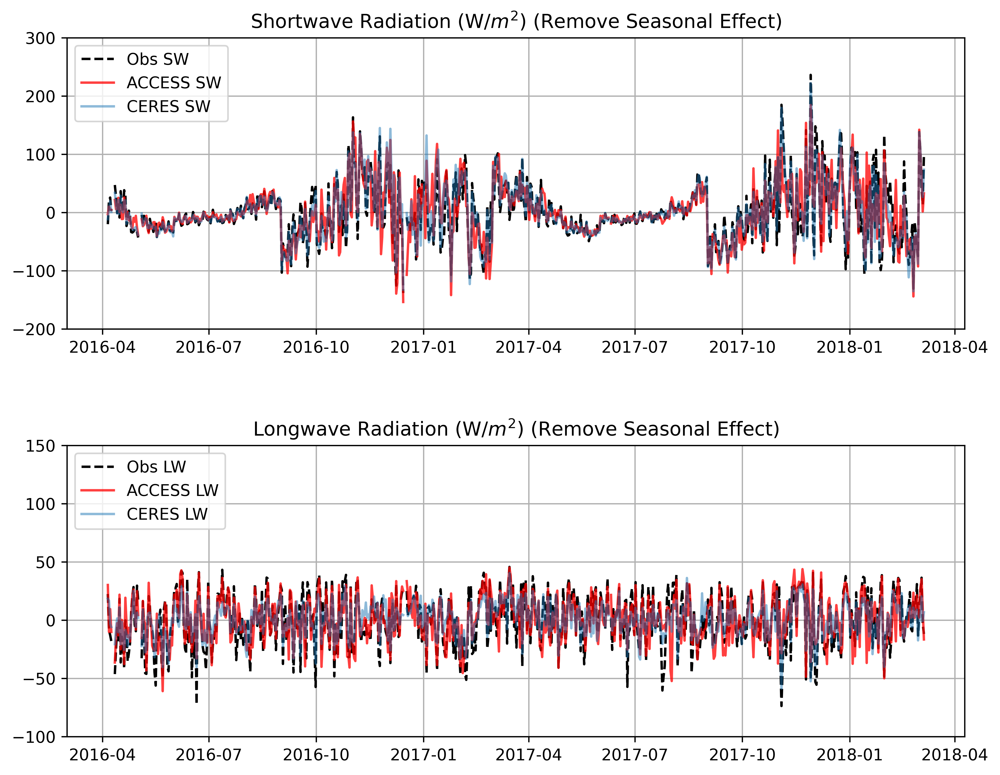

In [44]:
fig = plt.figure(figsize=(10,8),dpi=600)
plt.subplots_adjust(hspace=0.4)

ax1 = plt.subplot(211,)
ax1.plot(daily_obs_SW_season['Obs SW'], label='Obs SW',color='black', linestyle='--');
ax1.plot(pd_data1D_SW_season['ACCESS SW'], label='ACCESS SW',color='red',alpha=0.75);
ax1.plot(pd_sat_SW_season['CERES SW'], label='CERES SW',alpha=0.5);
plt.legend();
plt.grid();
plt.ylim(-200,300)
plt.title('Shortwave Radiation (W/$m^{2}$) (Remove Seasonal Effect)')

ax2 = plt.subplot(212,)
ax2.plot(daily_obs_LW_season['Obs LW'], label='Obs LW',color='black', linestyle='--');
ax2.plot(pd_data1D_LW_season['ACCESS LW'], label='ACCESS LW',color='red',alpha=0.75);
ax2.plot(pd_sat_LW_season['CERES LW'], label='CERES LW',alpha=0.5);
plt.legend(loc='upper left');
plt.grid();
plt.ylim(-100,150)
plt.title('Longwave Radiation (W/$m^{2}$) (Remove Seasonal Effect)')

### Correlations

In [52]:
pd_SW_season = pd.concat([pd_data1D_SW_season['ACCESS SW'],daily_obs_SW_season['Obs SW'],pd_sat_SW_season['CERES SW']],axis=1)
pd_SW_season.corr()

,ACCESS SW,Obs SW,CERES SW
ACCESS SW,1.000000,0.916522,0.943631
Obs SW,0.916522,1.000000,0.976786
CERES SW,0.943631,0.976786,1.000000


In [53]:
pd_LW_season = pd.concat([pd_data1D_LW_season['ACCESS LW'],daily_obs_LW_season['Obs LW'],pd_sat_LW_season['CERES LW']],axis=1)
pd_LW_season.corr()

,ACCESS LW,Obs LW,CERES LW
ACCESS LW,1.000000,0.796187,0.690045
Obs LW,0.796187,1.000000,0.828950
CERES LW,0.690045,0.828950,1.000000


## Make seasonal plots

In [45]:
DJF_obs_SW = pd.concat([daily_obs_SW['2016-12':'2017-02'],daily_obs_SW['2017-12':'2018-02']],axis=0)
MAM_obs_SW = pd.concat([daily_obs_SW['2016-04':'2016-05'],daily_obs_SW['2017-03':'2017-05'],daily_obs_SW['2018-03']],axis=0)
JJA_obs_SW = pd.concat([daily_obs_SW['2016-06':'2016-08'],daily_obs_SW['2017-06':'2017-08']],axis=0)
SON_obs_SW = pd.concat([daily_obs_SW['2016-09':'2016-11'],daily_obs_SW['2017-09':'2017-11']],axis=0)

DJF_obs_LW = pd.concat([daily_obs_LW['2016-12':'2017-02'],daily_obs_LW['2017-12':'2018-02']],axis=0)
MAM_obs_LW = pd.concat([daily_obs_LW['2016-04':'2016-05'],daily_obs_LW['2017-03':'2017-05'],daily_obs_LW['2018-03']],axis=0)
JJA_obs_LW = pd.concat([daily_obs_LW['2016-06':'2016-08'],daily_obs_LW['2017-06':'2017-08']],axis=0)
SON_obs_LW = pd.concat([daily_obs_LW['2016-09':'2016-11'],daily_obs_LW['2017-09':'2017-11']],axis=0)

DJF_model_SW = pd.concat([pd_data1D_SW['2016-12':'2017-02'],pd_data1D_SW['2017-12':'2018-02']],axis=0)
MAM_model_SW = pd.concat([pd_data1D_SW['2016-04':'2016-05'],pd_data1D_SW['2017-03':'2017-05'],pd_data1D_SW['2018-03']],axis=0)
JJA_model_SW = pd.concat([pd_data1D_SW['2016-06':'2016-08'],pd_data1D_SW['2017-06':'2017-08']],axis=0)
SON_model_SW = pd.concat([pd_data1D_SW['2016-09':'2016-11'],pd_data1D_SW['2017-09':'2017-11']],axis=0)

DJF_model_LW = pd.concat([pd_data1D_LW['2016-12':'2017-02'],pd_data1D_LW['2017-12':'2018-02']],axis=0)
MAM_model_LW = pd.concat([pd_data1D_LW['2016-04':'2016-05'],pd_data1D_LW['2017-03':'2017-05'],pd_data1D_LW['2018-03']],axis=0)
JJA_model_LW = pd.concat([pd_data1D_LW['2016-06':'2016-08'],pd_data1D_LW['2017-06':'2017-08']],axis=0)
SON_model_LW = pd.concat([pd_data1D_LW['2016-09':'2016-11'],pd_data1D_LW['2017-09':'2017-11']],axis=0)

DJF_sat_SW = pd.concat([pd_sat_SW['2016-12':'2017-02'],pd_sat_SW['2017-12':'2018-02']],axis=0)
MAM_sat_SW = pd.concat([pd_sat_SW['2016-04':'2016-05'],pd_sat_SW['2017-03':'2017-05'],pd_sat_SW['2018-03']],axis=0)
JJA_sat_SW = pd.concat([pd_sat_SW['2016-06':'2016-08'],pd_sat_SW['2017-06':'2017-08']],axis=0)
SON_sat_SW = pd.concat([pd_sat_SW['2016-09':'2016-11'],pd_sat_SW['2017-09':'2017-11']],axis=0)

DJF_sat_LW = pd.concat([pd_sat_LW['2016-12':'2017-02'],pd_sat_LW['2017-12':'2018-02']],axis=0)
MAM_sat_LW = pd.concat([pd_sat_LW['2016-04':'2016-05'],pd_sat_LW['2017-03':'2017-05'],pd_sat_LW['2018-03']],axis=0)
JJA_sat_LW = pd.concat([pd_sat_LW['2016-06':'2016-08'],pd_sat_LW['2017-06':'2017-08']],axis=0)
SON_sat_LW = pd.concat([pd_sat_LW['2016-09':'2016-11'],pd_sat_LW['2017-09':'2017-11']],axis=0)

In [46]:
fig = plt.figure(figsize=(20,10), dpi=600)
plt.subplots_adjust(hspace=0.85)

ax1 = plt.subplot(421,)
sns.kdeplot(x=DJF_obs_SW, label='Obs SW 173.3 W/$m^{2}$',color='black')
sns.kdeplot(x=DJF_model_SW, label='ACCESS SW 196.4 W/$m^{2}$',color='red');
sns.kdeplot(x=DJF_sat_SW, label='CERES SW 190.0 W/$m^{2}$');
ax1.vlines([173.3], 0, 0.00475, linestyles='dashed', colors='black')
ax1.vlines([196.4], 0, 0.0055, linestyles='dashed', colors='red')
ax1.vlines([190.9], 0, 0.0053, linestyles='dashed')
plt.legend()
plt.xlabel('Radiation (W/$m^{2}$)')
plt.ylim(0,0.006)
plt.title('(a) SW DJF distribution')

ax2 = plt.subplot(423,sharex=ax1)
sns.kdeplot(x=MAM_obs_SW, label='Obs SW 51.7 W/$m^{2}$',color='black')
sns.kdeplot(x=MAM_model_SW, label='ACCESS SW 51.8 W/$m^{2}$',color='red');
sns.kdeplot(x=MAM_sat_SW, label='CERES SW 52.7 W/$m^{2}$');
ax2.vlines([51.7], 0, 0.009, linestyles='dashed', colors='black')
ax2.vlines([51.8], 0, 0.01, linestyles='dashed', colors='red')
ax2.vlines([52.7], 0, 0.009, linestyles='dashed')
plt.legend()
plt.xlabel('Radiation  (W/$m^{2}$)')
plt.title('(b) SW MAM distribution')

ax3 = plt.subplot(425,sharex=ax1)
sns.kdeplot(x=JJA_obs_SW, label='Obs SW 27.0 W/$m^{2}$',color='black')
sns.kdeplot(x=JJA_model_SW, label='ACCESS SW 24.4 W/$m^{2}$',color='red');
sns.kdeplot(x=JJA_sat_SW, label='CERES SW 26.8 W/$m^{2}$');
ax3.vlines([27.0], 0, 0.021, linestyles='dashed', colors='black')
ax3.vlines([24.4], 0, 0.02, linestyles='dashed', colors='red')
ax3.vlines([26.8], 0, 0.021, linestyles='dashed')
plt.legend()
plt.xlabel('Radiation (W/$m^{2}$)')
plt.title('(c) SW JJA distribution')
plt.ylim(0,0.040)

ax4 = plt.subplot(427,sharex=ax1)
sns.kdeplot(x=SON_obs_SW, label='Obs SW 129.2 W/$m^{2}$',color='black')
sns.kdeplot(x=SON_model_SW, label='ACCESS SW 141 W/$m^{2}$',color='red');
sns.kdeplot(x=SON_sat_SW, label='CERES SW 137 W/$m^{2}$');
ax4.vlines([129.2], 0, 0.0058, linestyles='dashed', colors='black')
ax4.vlines([141], 0, 0.00581, linestyles='dashed', colors='red')
ax4.vlines([137], 0, 0.0063, linestyles='dashed')
plt.legend()
plt.xlabel('Radiation (W/$m^{2}$)')
plt.title('(d) SW SON distribution')

ax5 = plt.subplot(422,)
sns.kdeplot(x=DJF_obs_LW, label='Obs LW 318.0 W/$m^{2}$',color='black')
sns.kdeplot(x=DJF_model_LW, label='ACCESS LW 317.6 W/$m^{2}$',color='red');
sns.kdeplot(x=DJF_sat_LW, label='CERES LW 312.4 W/$m^{2}$');
ax5.vlines([318.0], 0, 0.013, linestyles='dashed', colors='black')
ax5.vlines([317.6], 0, 0.018, linestyles='dashed', colors='red')
ax5.vlines([312.4], 0, 0.0215, linestyles='dashed')
plt.legend()
plt.xlabel('Radiation (W/$m^{2}$)')
plt.ylim(0,0.03)
plt.title('(e) LW DJF distribution')

ax6 = plt.subplot(424,sharex=ax5)
sns.kdeplot(x=MAM_obs_LW, label='Obs LW 315.3 W/$m^{2}$',color='black')
sns.kdeplot(x=MAM_model_LW, label='ACCESS LW 313.7 W/$m^{2}$',color='red');
sns.kdeplot(x=MAM_sat_LW, label='CERES LW 302.4 W/$m^{2}$');
ax6.vlines([315.3], 0, 0.015, linestyles='dashed', colors='black')
ax6.vlines([313.7], 0, 0.018, linestyles='dashed', colors='red')
ax6.vlines([302.4], 0, 0.0245, linestyles='dashed')
plt.legend()
plt.xlabel('Radiation (W/$m^{2}$)')
plt.ylim(0,0.03)
plt.title('(f) LW MAM distribution')

ax7 = plt.subplot(426,sharex=ax5)
sns.kdeplot(x=JJA_obs_LW, label='Obs LW 305.2 W/$m^{2}$',color='black')
sns.kdeplot(x=JJA_model_LW, label='ACCESS LW 306.6 W/$m^{2}$',color='red');
sns.kdeplot(x=JJA_sat_LW, label='CERES LW 290.0 W/$m^{2}$');
ax7.vlines([305.2], 0, 0.017, linestyles='dashed', colors='black')
ax7.vlines([306.6], 0, 0.02, linestyles='dashed', colors='red')
ax7.vlines([290.0], 0, 0.032, linestyles='dashed')
plt.legend()
plt.xlabel('Radiation (W/$m^{2}$)')
plt.ylim(0,0.04)
plt.title('(g) LW JJA distribution')

ax8 = plt.subplot(428,sharex=ax5)
sns.kdeplot(x=SON_obs_LW, label='Obs LW 308.9 W/$m^{2}$',color='black')
sns.kdeplot(x=SON_model_LW, label='ACCESS LW 307.8 W/$m^{2}$',color='red');
sns.kdeplot(x=SON_sat_LW, label='CERES LW 301.7 W/$m^{2}$');
ax8.vlines([308.9], 0, 0.015, linestyles='dashed', colors='black')
ax8.vlines([307.8], 0, 0.0175, linestyles='dashed', colors='red')
ax8.vlines([301.7], 0, 0.022, linestyles='dashed')
plt.legend()
plt.xlabel('Radiation (W/$m^{2}$)')
plt.ylim(0,0.03)
plt.title('(h) LW SON distribution')
# plt.savefig('/Users/peizhangcheng/Desktop/SW&LW_radiation_seasonal.jpg')

Text(0.5, 1.0, '(h) LW SON distribution')

In [48]:
np.std(DJF_model_SW-DJF_obs_SW)

48.02264086926654

In [ ]:
np.std(DJF_model_SW-DJF_obs_SW)

In [60]:
len(SON_model_LW)

182

In [61]:
len(JJA_model_SW)

183

In [62]:
len(DJF_model_SW)

178

In [63]:
len(MAM_model_SW)

150

In [64]:
stats.ttest_ind(DJF_obs_SW.dropna(),DJF_model_SW.dropna())

Ttest_indResult(statistic=-3.776920369007132, pvalue=0.00018619336286708634)

In [65]:
stats.ttest_ind(DJF_obs_LW.dropna(),DJF_model_LW.dropna())

Ttest_indResult(statistic=1.257581267539317, pvalue=0.20937220029190412)

In [66]:
stats.ttest_ind(DJF_obs_SW.dropna(),DJF_sat_SW.dropna())

Ttest_indResult(statistic=-2.9790803664046694, pvalue=0.003090677895262485)

In [67]:
stats.ttest_ind(DJF_obs_LW.dropna(),DJF_sat_LW.dropna())

Ttest_indResult(statistic=4.176380254615642, pvalue=3.733793431870722e-05)

In [68]:
stats.ttest_ind(MAM_obs_SW.dropna(),MAM_model_SW.dropna())

Ttest_indResult(statistic=-0.10372583588635582, pvalue=0.9174566946251602)

In [69]:
stats.ttest_ind(MAM_obs_LW.dropna(),MAM_model_LW.dropna())

Ttest_indResult(statistic=1.5295442737944676, pvalue=0.12719034965167514)

In [70]:
stats.ttest_ind(MAM_obs_SW.dropna(),MAM_sat_SW.dropna())

Ttest_indResult(statistic=-0.24723290101191353, pvalue=0.8048982281901778)

In [71]:
stats.ttest_ind(MAM_obs_LW.dropna(),MAM_sat_LW.dropna())

Ttest_indResult(statistic=7.096809035275659, pvalue=9.362162192132942e-12)

In [72]:
stats.ttest_ind(JJA_obs_SW.dropna(),JJA_model_SW.dropna())

Ttest_indResult(statistic=1.1954458908212966, pvalue=0.23269109506480504)

In [73]:
stats.ttest_ind(JJA_obs_LW.dropna(),JJA_model_LW.dropna())

Ttest_indResult(statistic=0.07492335591138509, pvalue=0.9403168517888458)

In [74]:
stats.ttest_ind(JJA_obs_SW.dropna(),JJA_sat_SW.dropna())

Ttest_indResult(statistic=-0.18736243376443742, pvalue=0.8514808669674938)

In [75]:
stats.ttest_ind(JJA_obs_LW.dropna(),JJA_sat_LW.dropna())

Ttest_indResult(statistic=9.16639457971262, pvalue=3.6591287678229296e-18)

In [76]:
stats.ttest_ind(SON_obs_SW.dropna(),SON_model_SW.dropna())

Ttest_indResult(statistic=-2.118366313985621, pvalue=0.03482489929403558)

In [77]:
stats.ttest_ind(SON_obs_LW.dropna(),SON_model_LW.dropna())

Ttest_indResult(statistic=1.2935047354761984, pvalue=0.19666130472219542)

In [78]:
stats.ttest_ind(SON_obs_SW.dropna(),SON_sat_SW.dropna())

Ttest_indResult(statistic=-1.5426398132595343, pvalue=0.12379187981395595)

In [79]:
stats.ttest_ind(SON_obs_LW.dropna(),SON_sat_LW.dropna())

Ttest_indResult(statistic=4.5781301696381975, pvalue=6.4595044191756295e-06)

In [87]:
DJF_SW = pd.concat([DJF_obs_SW,DJF_model_SW,DJF_sat_SW],axis=1)
DJF_SW.corr()

,Obs SW,ACCESS SW,CERES SW
Obs SW,1.000000,0.704057,0.915476
ACCESS SW,0.704057,1.000000,0.754722
CERES SW,0.915476,0.754722,1.000000


In [88]:
DJF_LW = pd.concat([DJF_obs_LW,DJF_model_LW,DJF_sat_LW],axis=1)
DJF_LW.corr()

,Obs LW,ACCESS LW,CERES LW
Obs LW,1.000000,0.812010,0.897383
ACCESS LW,0.812010,1.000000,0.669822
CERES LW,0.897383,0.669822,1.000000


In [89]:
MAM_SW = pd.concat([MAM_obs_SW,MAM_model_SW,MAM_sat_SW],axis=1)
MAM_SW.corr()

,Obs SW,ACCESS SW,CERES SW
Obs SW,1.000000,0.875664,0.956512
ACCESS SW,0.875664,1.000000,0.929453
CERES SW,0.956512,0.929453,1.000000


In [90]:
MAM_LW = pd.concat([MAM_obs_LW,MAM_model_LW,MAM_sat_LW],axis=1)
MAM_LW.corr()

,Obs LW,ACCESS LW,CERES LW
Obs LW,1.000000,0.809168,0.832353
ACCESS LW,0.809168,1.000000,0.701929
CERES LW,0.832353,0.701929,1.000000


In [91]:
JJA_SW = pd.concat([JJA_obs_SW,JJA_model_SW,JJA_sat_SW],axis=1)
JJA_SW.corr()

,Obs SW,ACCESS SW,CERES SW
Obs SW,1.000000,0.882029,0.977454
ACCESS SW,0.882029,1.000000,0.891067
CERES SW,0.977454,0.891067,1.000000


In [92]:
JJA_LW = pd.concat([JJA_obs_LW,JJA_model_LW,JJA_sat_LW],axis=1)
JJA_LW.corr()

,Obs LW,ACCESS LW,CERES LW
Obs LW,1.000000,0.752659,0.824687
ACCESS LW,0.752659,1.000000,0.709259
CERES LW,0.824687,0.709259,1.000000


In [93]:
SON_SW = pd.concat([SON_obs_SW,SON_model_SW,SON_sat_SW],axis=1)
SON_SW.corr()

,Obs SW,ACCESS SW,CERES SW
Obs SW,1.000000,0.827071,0.967678
ACCESS SW,0.827071,1.000000,0.868688
CERES SW,0.967678,0.868688,1.000000


In [94]:
SON_LW = pd.concat([SON_obs_LW,SON_model_LW,SON_sat_LW],axis=1)
SON_LW.corr()

,Obs LW,ACCESS LW,CERES LW
Obs LW,1.000000,0.767168,0.861948
ACCESS LW,0.767168,1.000000,0.712058
CERES LW,0.861948,0.712058,1.000000
